In [ ]:
#Unziping our data
!unzip "drive/MyDrive/Dog Vision/dog-breed-identification.zip" -d "drive/MyDrive/Dog Vision/"

Streaming output truncated to the last 5000 lines.
  inflating: drive/MyDrive/Dog Vision/train/83bc62b0fffa99a9c94ba0b67a5f7395.jpg  
  inflating: drive/MyDrive/Dog Vision/train/83bcff6b55ee179a7c123fa6103c377a.jpg  
  inflating: drive/MyDrive/Dog Vision/train/83be6d622ab74a5e7e08b53eb8fd566a.jpg  
  inflating: drive/MyDrive/Dog Vision/train/83c2d7419b0429b9fe953bc1b6cddbec.jpg  
  inflating: drive/MyDrive/Dog Vision/train/83cf7d7cd2a759a93e2ffd95bea9c6fb.jpg  
  inflating: drive/MyDrive/Dog Vision/train/83d405858f0931722ef21e8ac0adee4d.jpg  
  inflating: drive/MyDrive/Dog Vision/train/83d4125a4c3c7dc5956563276cb1cd74.jpg  
  inflating: drive/MyDrive/Dog Vision/train/83f0bb565b2186dbcc6a9d009cb26ff2.jpg  
  inflating: drive/MyDrive/Dog Vision/train/83fad0718581a696132c96c166472627.jpg  
  inflating: drive/MyDrive/Dog Vision/train/83fbbcc9a612e3f712b1ba199da61f20.jpg  
  inflating: drive/MyDrive/Dog Vision/train/8403d8936430c2f05ab7d74d23c2c0cb.jpg  
  inflating: drive/MyDrive/Dog Visio

# End-to-End Multiclass Dog Breed Classification

This notebook build an end-to-end multi-class image classifier using TenserFlow 2.0 and TenserFlow Hub.

## 1. Problem

Identifing the breed of dog given an images of a dog.

When i am sitting at cafe and i took the photo of dog, and i want to know what breed of dog it is.

## 2. Data

The data i am using is from kaggle's dog breed identification competition:
https://www.kaggle.com/c/dog-breed-identification/data

## 3. Evaluation

The Evaluation is a file with prediction probabilities for each dog breed of each test image.
https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

## 4. Features

Some information about the data:
* We are dealing with images(unstructured data) so its probabily best we use deep learning/transfer learning.
* There are 120 breeds of dogs (this means there are 120 different classes)
* There are 10,000+ images in the training sets(these images have labels)
* There are 10,000+ images in test sets (thes images have no labels,because we will want to predict them).

### Get our workspace ready:

* Import Tensorflow 2.x 
* Import Tensorflow Hub
* Make sure we are using GPU

In [ ]:
# import neccesary tool into colab
import tensorflow as tf
import tensorflow_hub as hub
print("TF version:" , tf.__version__)
print("TF Hub version:" , hub.__version__)

# Check the availability of GPU
print("GPU" , "Available (Yessssssss)" if tf.config.list_physical_devices("GPU") else "not available :(")

TF version: 2.5.0
TF Hub version: 0.12.0
GPU Available (Yessssssss)


### Getting our data ready(turning into tensors)

With all machine learning models,our data has to be in numerical format. So thats what will be doing first. Turning our images into Tensors (numerical represwentation).

Lets start with accessing our data and checking out the labels.

In [ ]:
import pandas as pd
labels_csv = pd.read_csv("drive/My Drive/Dog Vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     6cecc5ec666f9ff8f0994a2b7b3b3c50  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# How many images of each breed(classes)
labels_csv["breed"].value_counts()

scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
brabancon_griffon        67
golden_retriever         67
komondor                 67
eskimo_dog               66
briard                   66
Name: breed, Length: 120, dtype: int64

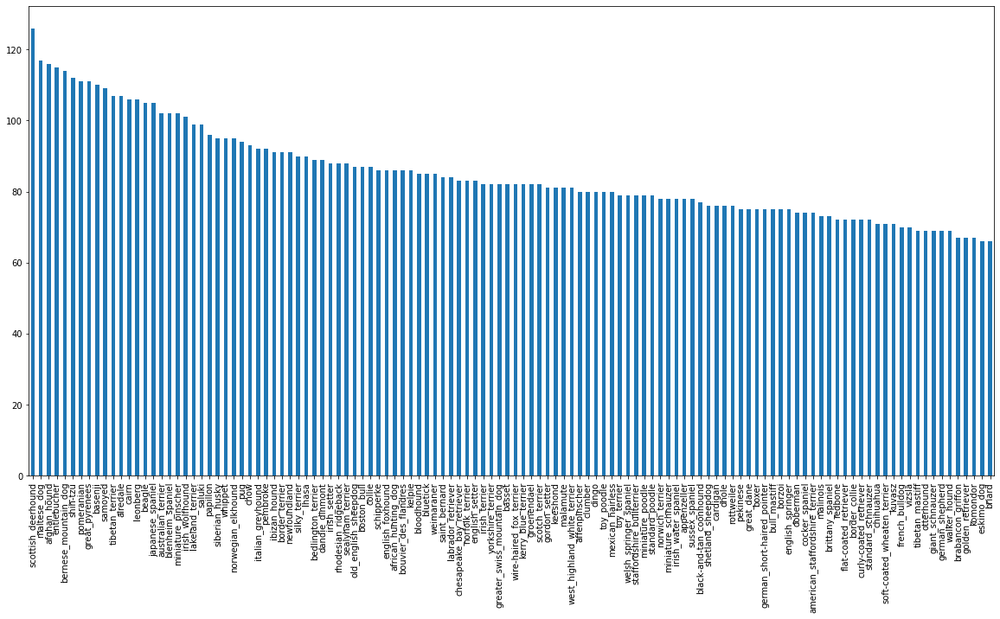

In [ ]:
labels_csv["breed"].value_counts().plot.bar(figsize=(20 , 10))

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

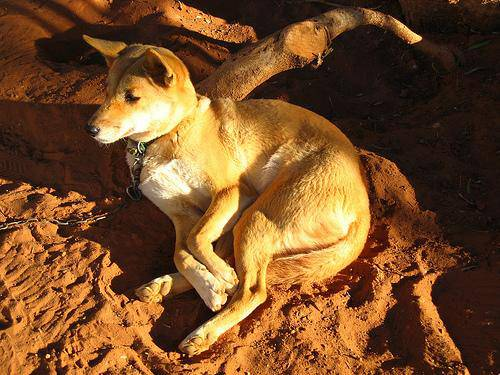

In [ ]:
# Lets view an image
from IPython.display import Image
Image("drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

## Getting images and there labels

Lets get a list of all of our image file pathnames

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# create pathnames from image ID's
filenames = [fname for fname in labels_csv["id"]]

# Check the first few
filenames[:10]

['000bec180eb18c7604dcecc8fe0dba07',
 '001513dfcb2ffafc82cccf4d8bbaba97',
 '001cdf01b096e06d78e9e5112d419397',
 '00214f311d5d2247d5dfe4fe24b2303d',
 '0021f9ceb3235effd7fcde7f7538ed62',
 '002211c81b498ef88e1b40b9abf84e1d',
 '00290d3e1fdd27226ba27a8ce248ce85',
 '002a283a315af96eaea0e28e7163b21b',
 '003df8b8a8b05244b1d920bb6cf451f9',
 '0042188c895a2f14ef64a918ed9c7b64']

In [ ]:
# Create file name for image ID's
filenames = ["drive/MyDrive/Dog Vision/train/" + fname + ".jpg" for fname in labels_csv["id"]]
filenames[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# Check whether the number of filename maches the actual size of image files
import os
if len(os.listdir("drive/MyDrive/Dog Vision/train/")) == len(filenames):
  print("Filesname matched actual amount of files...proceed")
else:
  print("Filenames donot match actual amount of files, check your directory") 

Filesname matched actual amount of files...proceed


In [ ]:
# Check random image
print(filenames[9000])

drive/MyDrive/Dog Vision/train/e20e32bf114141e20a1af854ca4d0ecc.jpg


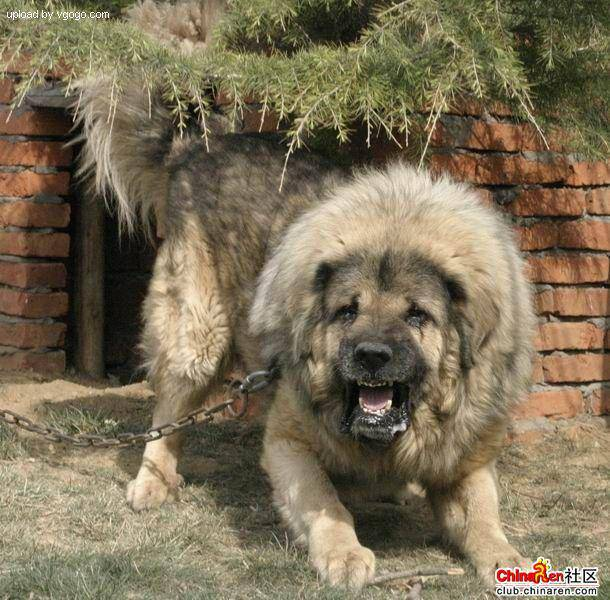

In [ ]:
Image(filenames[9000])

In [ ]:
labels_csv["breed"][9000]

'tibetan_mastiff'

Since we have got our training image filepaths in the list, lets prepare our labels

In [ ]:
import numpy as np
labels = labels_csv["breed"].to_numpy()
#labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
# See if the number of labels matches the number of filenames
if len(labels) == len(filenames):
  print("Number of labels same the number of filenames")
else:
  print("Nymber of labels is no same as number of filenames")   

Number of labels same the number of filenames


In [ ]:
# Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [ ]:
# Turn a single label into an array of boolean
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turn all labels into an array of boolean
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
# Example turning boolean labels into integers
print(labels[0]) # origonal labels
print(np.where(unique_breeds == labels[0])) # index where variable occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be 1 where sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print(labels[2])
print(boolean_labels[2].argmax())
print(boolean_labels[2].astype(int))

pekinese
85
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
filenames[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

## Creating our own Validation set

Since kaggle doesnot provide validation set so we are going to make our own

In [ ]:
# Setup x and y variable
x = filenames
y = boolean_labels

In [ ]:
len(filenames)

10222

We are going to experimenting with ~1000 images and increase as needed

In [ ]:
# Set number of images used for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000} 

In [ ]:
# Lets split our data into train and validation sets
from sklearn.model_selection import train_test_split

# Lets split our data into train and validation split of total size NUM_IMAGES
x_train , x_valid , y_train , y_valid = train = train_test_split(x[:NUM_IMAGES],
                                                                 y[:NUM_IMAGES],
                                                                 test_size=0.2,
                                                                 random_state=42)
len(x_train) , len(y_train) , len(x_valid) , len(y_valid)


(800, 800, 200, 200)

In [ ]:
# Lets see the training data
x_train[:2] , y_train[:2]

(['drive/MyDrive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, Fal

## Preprocessing Images (turning into tensor)

To preprocess our images we are going to write a function which perform few things:

1. Take an image path as input.
2. Use Tensorflow to read the file and save it to variable. `image`
3. Turn our Turn our `image` (a jpg) into Tensors
4. Resize the `image` to be shape of (224 , 224)
5. Return the modified `image` 

In [ ]:
# Convert image into numpy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
image.max() , image.min()

(255, 0)

In [ ]:
image[:2]

array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)

In [ ]:
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

Now we have seen what an image looks like as a Tensor, lets's lets make a function to preprocess them:

1. Take an image path as input.
2. Use Tensorflow to read the file and save it to variable. `image`
3. Turn our Turn our `image` (a jpg) into Tensors
4. Normalize our image (convert color channels values from 0-255 to 0-1)
5. Resize the `image` to be shape of (224 , 224)
6. Return the modified `image` 

In [ ]:
# Define Image size
IMG_SIZE = 224

# create a function for preprocessing image
def process_image(image_path):
  """
  Takes an image file path and turn the image into Tensor
  """
  # Read in an image file
  image = tf.io.read_file(image_path)

  # Turn the jpg images into numerical Tensor with 3 colour channels(Red , Green , Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channels values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (244 , 244)
  image = tf.image.resize(image, size=[IMG_SIZE , IMG_SIZE])

  return image

In [ ]:
tensor = tf.io.read_file(filenames[26])
tensor

<tf.Tensor: shape=(), dtype=string, numpy=b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\n\x07\x07\x08\x07\x06\n\x08\x08\x08\x0b\n\n\x0b\x0e\x18\x10\x0e\r\r\x0e\x1d\x15\x16\x11\x18#\x1f%$"\x1f"!&+7/&)4)!"0A149;>>>%.DIC<H7=>;\xff\xdb\x00C\x01\n\x0b\x0b\x0e\r\x0e\x1c\x10\x10\x1c;("(;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;\xff\xc0\x00\x11\x08\x01\xf4\x01w\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1f\x00\x00\x01\x05\x01\x01\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x01\x02\x03\x04\x05\x06\x07\x08\t\n\x0b\xff\xc4\x00\xb5\x10\x00\x02\x01\x03\x03\x02\x04\x03\x05\x05\x04\x04\x00\x00\x01}\x01\x02\x03\x00\x04\x11\x05\x12!1A\x06\x13Qa\x07"q\x142\x81\x91\xa1\x08#B\xb1\xc1\x15R\xd1\xf0$3br\x82\t\n\x16\x17\x18\x19\x1a%&\'()*456789:CDEFGHIJSTUVWXYZcdefghijstuvwxyz\x83\x84\x85\x86\x87\x88\x89\x8a\x92\x93\x94\x95\x96\x97\x98\x99\x9a\xa2\xa3\xa4\xa5\xa6\xa7\xa8\xa9\xaa\xb2\xb3\xb4\xb5\xb6\xb7\xb8\xb9\xba\xc2\xc3\xc4\xc5\xc6\xc7\xc8\xc9\xca

In [ ]:
tf.image.decode_jpeg(tensor , channels=3)

<tf.Tensor: shape=(500, 375, 3), dtype=uint8, numpy=
array([[[ 59,  68,  65],
        [ 64,  73,  70],
        [ 71,  80,  77],
        ...,
        [115, 128, 108],
        [115, 128, 108],
        [110, 123, 103]],

       [[ 65,  74,  71],
        [ 72,  81,  78],
        [ 79,  88,  85],
        ...,
        [114, 127, 107],
        [117, 130, 110],
        [116, 129, 109]],

       [[ 68,  77,  74],
        [ 76,  85,  82],
        [ 83,  92,  89],
        ...,
        [114, 127, 107],
        [120, 133, 113],
        [123, 136, 116]],

       ...,

       [[173, 200, 155],
        [164, 179, 136],
        [181, 166, 133],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[142, 159, 117],
        [147, 154, 113],
        [189, 174, 141],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[167, 179, 139],
        [167, 172, 132],
        [204, 188, 155],
        ...,
        [255, 255, 25

## Turning our data into batches

Why turn our data to batches?

Lets say you are trying to process 10,000+ images in one go...they all might not fit into memory.

So thats why we do about 32 (this is batch size) images at a time (you can manually change the batch size if needed)

In order to use Tensorflow effectivily, we need our data in the form of Tensor tuples which look like this:
`(image , label)` 

In [ ]:
# Create the simple fuction to return a tuple (image , label)
def get_image_label(image_path , label):

  """
  Takes an image file path name and associate label,
  process the image and return a tuple of (image , label).
  """
  image = process_image(image_path)
  return image , label 

In [ ]:
# Demo of above
(process_image(x[42]) , tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we have got a way to turn our data into tuples of Tensors in the form: (image , label), lets make a fuction to turn all of aur data(x and y) into batches.

In [ ]:
# Define a batch size 32 is a good start
BATCH_SIZE = 32

# Create a fuction to turn our data into batches
def create_data_batches(x , y=None , batch_size=BATCH_SIZE , valid_data=False , test_data=False):
  """
  Creates batches of data out of image (x) and label (y) pairs.
  Shuffle the data if its training data but didnot shuffle if ots validation data.
  Also accept test data as input (no labels).
  """

  # If the data is test dataset, we probably dont have labels
  if test_data:
    print("Creating test data batches....")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x))) # only file path no label
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data id valid data id valid dataset, we dont need to shuffle it
  elif valid_data:
    print("Creatring validation data batches....")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), # filepaths
                                               tf.constant(y)))# labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches....")
    # Turn the filepath and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                               tf.constant(y)))
    # shuffling pathnames and labels before mapping image processor function is faster than shuffling images   
    data = data.shuffle(buffer_size=len(x))

    # Creating (image , label) tuples (this also turn the the image path into processed image)
    data = data.map(get_image_label)

    # Turns the training data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch                                   

In [ ]:
# Creating training and validation data batches
train_data = create_data_batches(x_train , y_train)
valid_data = create_data_batches(x_valid, y_valid , valid_data=True)

Creating training data batches....
Creatring validation data batches....


In [ ]:
# Check out the different attribute of our data batches
train_data.element_spec, valid_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualization Data Batches

Our data is now in batches, however these can be little hard to understand lets visualize them. 

In [ ]:
import matplotlib.pyplot as plt

# Create a fuction for viewing images in data batch
def show_25_images(images , labels):
  """
  Display a plot of 25 images and their labels from the data batch
  """
  # Setup the figure
  plt.figure(figsize=(10 , 10))

  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplot (5 rows , 5 columns)
    ax = plt.subplot(5 , 5 , i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")

In [ ]:
train_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [ ]:
unique_breeds[y[0].argmax()]

'boston_bull'

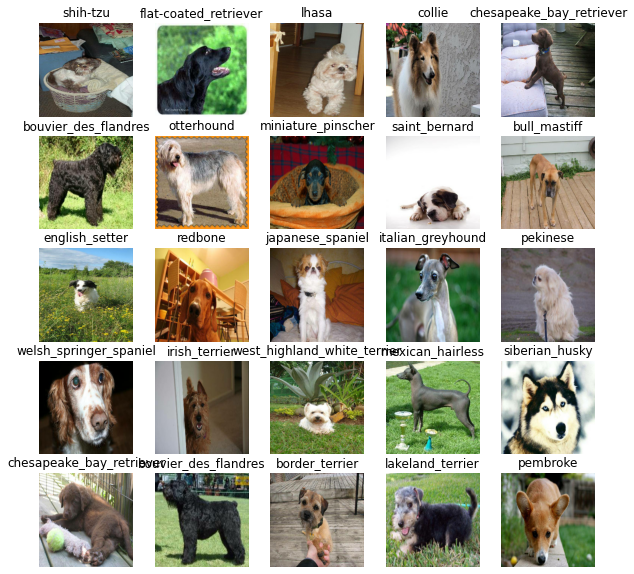

In [ ]:
# Now lets visualize the training data
train_images , train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images , train_labels)

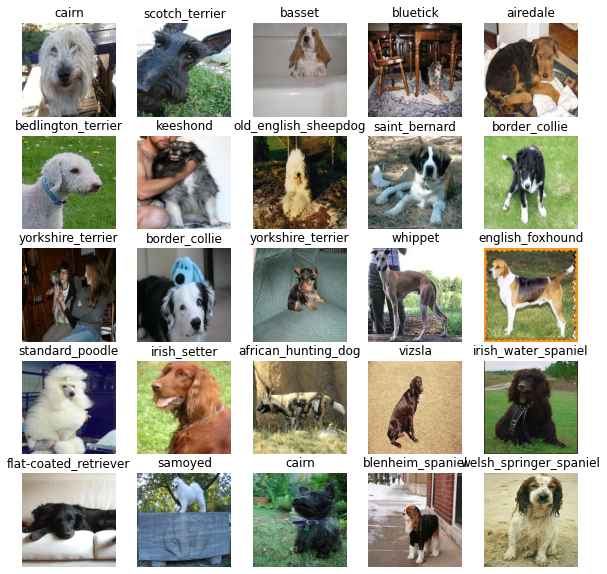

In [ ]:
# Now visualize the validation set
val_images , val_labels = next(valid_data.as_numpy_iterator())
show_25_images(val_images , val_labels)

## Build a model

Before building a model there are few things we need to define:
* The input shape (our images shape, in the form of tensors) to our model.
* The output shape (image labels, in the form of Tensors) of our model.
* The URL of model we want to use is from Tensorflow Hub :https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5

In [ ]:
# Setup input shape to model
INPUT_SHAPE = [None , IMG_SIZE , IMG_SIZE , 3] # batch , height , width , color channel

# Setup output shape of the model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFLOE Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

Now we have got our inputs, outputs and model ready to go. Lets put them together into a Keras deep learning model!
Knowing this Lets create a function which:
* Takes the input shape, output shape and model we have choosen as a parameter.
* Defines the layers in keras model in sequential fashion.
* Compiles the model(says it should be evaluated and improved)
* Builds the model (tells the model the input shape it will be getting)
* Returns the model.

All of these steps can be found here :https://www.tensorflow.org/guide/keras/sequential_model

In [ ]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:" , MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1(input layers)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE,
    activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"] 
  )

  # Build a model
  model.build(INPUT_SHAPE)
  return model

In [ ]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
keras_layer (KerasLayer)     (None, 1001)              5432713   
_________________________________________________________________
dense (Dense)                (None, 120)               120240    
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating Callbacks

Callbacks are helping functiona a model can use during during training to do such things as save its progress, check its progress or stop training if model stops improving.

we will create two callbacks, one for TensorBoard which helps track our models progress and another for early stoping which prevants our model for trainng too long.

### TensorBoard Callback

To Setup a TensorBoard callback we need to do 3 things:
1. Load the TensorBoard notebook extention.
2. Create a TensorBoard Callback which is able to save logs to directory and pass it to our model's `fit()` function.
3. Visualize our models training logs with the `%tensorboard` magic function(we will do this after model training).

In [ ]:
# Load TensorBoard notebook extention
%load_ext tensorboard

In [ ]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/MyDrive/Dog Vision/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

## Early Stopping Callback

Early stoping callback hepls to stop our model overfitting bu stopping training if a certain evaluation metrics is stop improving.
https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [ ]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

## Training a model(on subset of data)
Our first model is ony going to train on 1000 images, to make sure everthing is working.

In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider",min:10, max:100}

In [ ]:
# Check to make sure we are still running on GPU
print("GPU","available (yess!!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

GPU available (yess!!!!!)


Let's create a function which trains a model.

* Create a model using `create_model()`
* Setup a tensorboard callback using `create_tensorboard_callback()`
* Call the `fit()` function on our model passing it the training data, validation data and number of epochs to train for (`NUM_EPOCHS`) and the callbacks we would like to use.
* Return a model

In [ ]:
# Build a function to train and return a trained  model
def train_model():
  """
  Trains a given model and return a trained version
  """
  # Create a model
  model = create_model()

  # Create a new tensorboard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to data passing it the callbacks we are created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=valid_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  # Return the fitted model
  return model

In [ ]:
# Fit the model to data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 10s 252ms/step - loss: 4.5182 - accuracy: 0.1050 - val_loss: 3.4033 - val_accuracy: 0.2600
Epoch 2/100
25/25 [==============================] - 4s 175ms/step - loss: 1.6004 - accuracy: 0.6925 - val_loss: 2.1451 - val_accuracy: 0.5200
Epoch 3/100
25/25 [==============================] - 4s 148ms/step - loss: 0.5626 - accuracy: 0.9375 - val_loss: 1.6267 - val_accuracy: 0.6000
Epoch 4/100
25/25 [==============================] - 4s 168ms/step - loss: 0.2509 - accuracy: 0.9900 - val_loss: 1.4237 - val_accuracy: 0.6350
Epoch 5/100
25/25 [==============================] - 4s 177ms/step - loss: 0.1474 - accuracy: 0.9975 - val_loss: 1.3584 - val_accuracy: 0.6550
Epoch 6/100
25/25 [==============================] - 4s 169ms/step - loss: 0.0991 - accuracy: 0.9987 - val_loss: 1.3159 - val_accuracy: 0.6550
Epoch 7/100
25/25 [=============================

**Question:** Its look like our model is overfitting because it perform far better on the training dataset than tha validation dataset, what are the some ways to prevant model overfitting in deep neural networks?

**Note:** Overfitting to begin with is a good thing! its mean our model is learning

### Checking the tendorboard logs

The TensorBoard magic fuction (%tensorboard) will access the log directory we created earlier and visualize its content.

In [ ]:
%tensorboard --logdir drive/MyDrive/Dog\ Vision/logs

Reusing TensorBoard on port 6006 (pid 696), started 0:21:19 ago. (Use '!kill 696' to kill it.)

<IPython.core.display.Javascript object>

## Making and Evaluating prediction using train model

In [ ]:
valid_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [ ]:
# Make prediction on validation data (not use to train on)
predictions = model.predict(valid_data, verbose=1)
predictions

7/7 [==============================] - 1s 113ms/step


array([[1.0536185e-03, 1.2509099e-05, 4.1773258e-04, ..., 3.6916557e-05,
        1.7804958e-05, 1.6158802e-04],
       [2.0280683e-03, 7.5413240e-04, 1.2730225e-02, ..., 2.6365145e-04,
        4.8143638e-04, 1.8774775e-04],
       [1.2699502e-05, 2.6991514e-05, 7.8609999e-05, ..., 3.5113138e-05,
        3.6048954e-05, 1.0366095e-04],
       ...,
       [1.1312889e-06, 5.2771093e-06, 6.0767292e-05, ..., 2.7707472e-06,
        2.1399104e-04, 2.7314498e-05],
       [3.6743181e-03, 3.0401801e-05, 1.5630660e-04, ..., 7.2171606e-05,
        6.0707331e-05, 2.9579826e-02],
       [6.4281753e-04, 1.2195594e-05, 9.0482895e-04, ..., 1.9465886e-02,
        1.4603381e-03, 5.2577532e-05]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
np.sum(predictions[0])

1.0

In [ ]:
# First prediction
index = 42
print(predictions[index])
print(f"Max Value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum:{np.sum(predictions[index])}")
print(f"Max Index:{np.argmax(predictions[index])}")
print(f"Predicted Label:{unique_breeds[np.argmax(predictions[index])]}")

[6.75069896e-05 6.26781839e-05 2.55731084e-05 1.01220518e-04
 7.49385625e-04 1.00296224e-04 4.06094216e-04 1.24009571e-03
 1.02150831e-02 5.25742471e-02 2.99952953e-05 1.86500602e-05
 1.01144484e-03 1.85030629e-03 2.54016276e-03 8.76206160e-03
 1.63572859e-05 4.18984593e-04 1.65655205e-04 1.35716968e-04
 2.03314794e-05 2.90422176e-04 1.18993106e-04 5.03880256e-05
 5.48851788e-02 6.08885712e-05 1.57884970e-05 1.62474389e-04
 3.11169977e-04 1.44561462e-04 2.55364925e-04 2.19097390e-04
 6.99751909e-05 5.22479095e-05 1.03543198e-05 8.57373598e-05
 9.48240850e-05 4.34239395e-04 1.26895771e-04 2.99492955e-01
 6.86622807e-04 2.23329316e-05 2.24421616e-03 2.93188477e-05
 1.85262834e-04 2.80809691e-05 3.65803455e-04 5.27935044e-04
 6.83906692e-05 1.00279530e-03 2.43600269e-04 6.61608283e-05
 3.66933062e-04 2.62419251e-03 2.00515751e-05 5.49961464e-04
 1.37069481e-04 1.28029060e-04 1.11535883e-04 2.50022076e-05
 6.42906016e-05 6.96277770e-04 3.32680393e-05 3.04545210e-05
 9.10074159e-05 1.343046

In [ ]:
 unique_breeds[26]

'cairn'

Having the above functioanlity is great but we want to do it at scale.

And it would be even better if we could see the image the prediction is being made on.

**Note:** Prediction Probability is also known as confidence level

In [ ]:
# Turn the prediction probabity into there respective label (easy to understand)
def get_pred_label(prediction_probabilities):
  """
  Turn an array of prediction probabilities into label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Getting a predicted label based on array of prediction probabilities
pred_label = get_pred_label(predictions[81])
pred_label

'dingo'

Now since our validation data is still in a batch datasets, we will have to unbachify it to make predictions on the validation images and then compare those prediction with validation labels(truth labels).

In [ ]:
valid_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [ ]:
# Create a fuction to unbatch the batch dataset(validation set)
def unbatchify(data):
  """
  Takes a batched dataset of (iamge , label) Tensor and returns seperate arrays of images and labels
  """
  images = []
  labels = []
  # Loop through the unbatch data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbachify the the validation data
val_images , val_labels = unbatchify(valid_data)
val_images[0] , val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.2770141 , 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_label(val_labels[0])

'affenpinscher'

In [ ]:
images_ = []
labels_ = []

# Loop through unbatch data
for image, label in valid_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)

images_[0] , labels_[0]


(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.2770141 , 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now we have ways to get:
* Predicted labels
* Validation labels (truth labels)
* Validation images

Lets make a fuction to make these all a bit more visual:

We will create a function which perform:
* Takes an array or prediction proibabilities, an array of truth labels and array of images and integers
* Convert the prediction probabilities to predict the label.
* Plot the predicted label, its predicted probability.

In [ ]:
def plot_pred(prediction_probabilities, labels , images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n] 
  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot images and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change color of title depending upon prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change the plot title to be predicted, probability of prediction and truth labels
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                     np.max(pred_prob)*100,
                                     true_label),
                                     color=color)

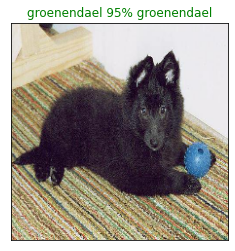

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=77)

Now we have got one function to visualize our models top prediction, lets make another to view our models top 10 predictions.
This function will:
* Take an input of prediction probabilities array and a ground truth array and an integer
* Find the prediction using get_pred_label().
* Find the top 10:
  * Prediction Probability Indexes.
  * Prediction Probability Indexes.
  * Prediction labels
* Plot the top 10 prediction Probability values and labels, coloring the true label green  


In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  plot the top 10 highest prediction confidennces along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup Plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")
  
  # Change the color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass  

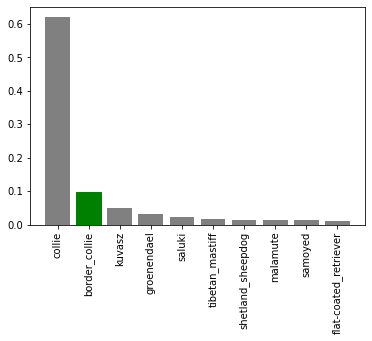

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

Now we have got some function to help us visualize our prediction and evaluate our model, lets check out a few

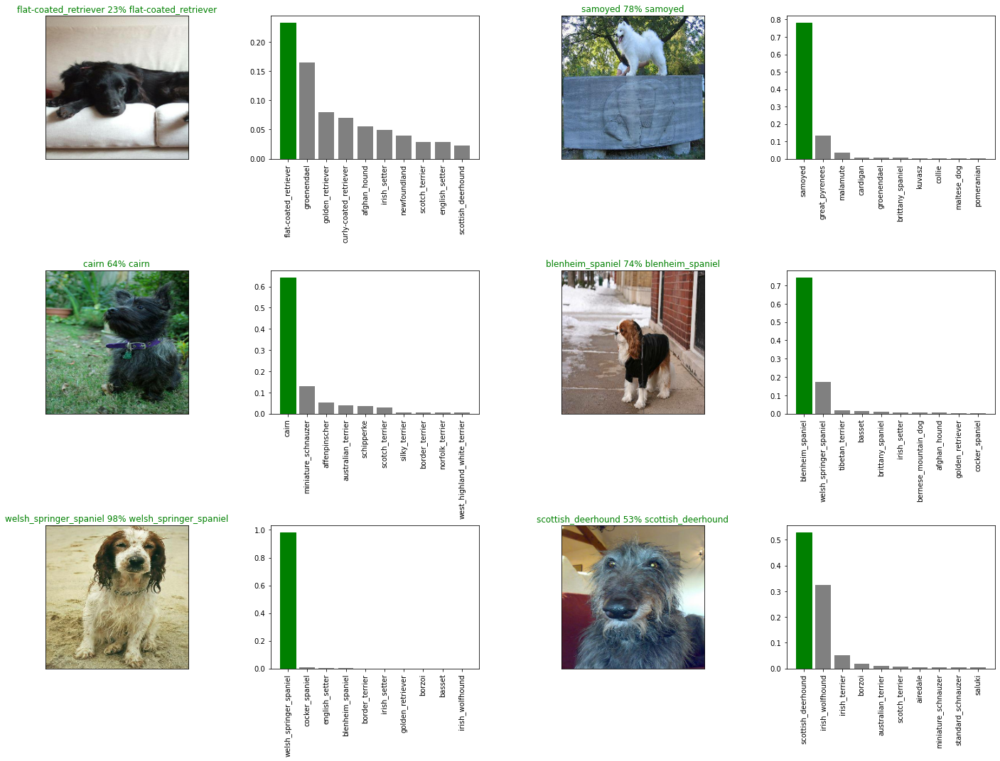

In [104]:
# Lets check out few prediction and their differernt values
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()  

**Challenge:** How Would you create a confusion metrics with our model predictions and true labels

## Saving and reloading a trained model


In [105]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  safe and give a model in directory and appends a suffix (string)
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("drive/MyDrive/Dog Vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save the format model
  print(f"Saving model to: {model_path}....")
  model.save(model_path)
  return model_path


In [106]:
# Create a function to load a train model
def load_model(model_path):
  """
  Load a save model from a specific path
  """
  print(f"Loading saved model from:{model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

Now we have got functions to train and load a trained model, lets make sure they work 

In [107]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: drive/MyDrive/Dog Vision/models/20210622-12251624364751-1000-images-mobilenetv2-Adam.h5....


'drive/MyDrive/Dog Vision/models/20210622-12251624364751-1000-images-mobilenetv2-Adam.h5'

In [108]:
# Load a trained model
loaded_1000_image_model = load_model('drive/MyDrive/Dog Vision/models/20210622-12251624364751-1000-images-mobilenetv2-Adam.h5')

Loading saved model from:drive/MyDrive/Dog Vision/models/20210622-12251624364751-1000-images-mobilenetv2-Adam.h5


In [109]:
# Evalute the pre-saved model
model.evaluate(valid_data)

7/7 [==============================] - 1s 121ms/step - loss: 1.2041 - accuracy: 0.6750


[1.204077959060669, 0.675000011920929]

In [110]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(valid_data)

7/7 [==============================] - 2s 119ms/step - loss: 1.2041 - accuracy: 0.6750


[1.204077959060669, 0.675000011920929]

## Training a big dog model (on the full data)

In [112]:
len(x) , len(y)

(10222, 10222)

In [113]:
# Create a data batch with full dataset
full_data = create_data_batches(x , y)

Creating training data batches....


In [114]:
full_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [115]:
#create a model for full data
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [118]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we can not moniter validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

**Note:** The cell beloe took alot of time because we are training model on full data

In [119]:
# Fit the full model to full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 44s 125ms/step - loss: 1.3554 - accuracy: 0.6709
Epoch 2/100
320/320 [==============================] - 38s 119ms/step - loss: 0.4045 - accuracy: 0.8801
Epoch 3/100
320/320 [==============================] - 38s 120ms/step - loss: 0.2365 - accuracy: 0.9362
Epoch 4/100
320/320 [==============================] - 39s 120ms/step - loss: 0.1567 - accuracy: 0.9605
Epoch 5/100
320/320 [==============================] - 39s 122ms/step - loss: 0.1085 - accuracy: 0.9773
Epoch 6/100
320/320 [==============================] - 40s 123ms/step - loss: 0.0775 - accuracy: 0.9865
Epoch 7/100
320/320 [==============================] - 39s 122ms/step - loss: 0.0594 - accuracy: 0.9924
Epoch 8/100
320/320 [==============================] - 39s 121ms/step - loss: 0.0454 - accuracy: 0.9937
Epoch 9/100
320/320 [==============================] - 40s 124ms/step - loss: 0.0371 - accuracy: 0.9972
Epoch 10/100
320/320 [==============================] - 40s 124m

In [120]:
save_model(full_model, suffix="full-iamge-set-mobilenetvv2-Adam")

Saving model to: drive/MyDrive/Dog Vision/models/20210622-13171624367857-full-iamge-set-mobilenetvv2-Adam.h5....


'drive/MyDrive/Dog Vision/models/20210622-13171624367857-full-iamge-set-mobilenetvv2-Adam.h5'

In [125]:
# Loading the full model
loaded_full_model = load_model("drive/MyDrive/Dog Vision/models/20210622-13171624367857-full-iamge-set-mobilenetvv2-Adam.h5")

Loading saved model from:drive/MyDrive/Dog Vision/models/20210622-13171624367857-full-iamge-set-mobilenetvv2-Adam.h5


## Making Prediction on test dataset

Since our model has been trained on images in the form of Tensor batches, to make prediction on test data, we will have to get it in the same format.

we created `created_data_batches()` earlier which can take the list of filename as input and cover them into Tensor Batches.

To make prediction on the set data we will:
* Get the test images of filename
* Convert the filename inti test data batches using `create_data_batches()` and setting the `test_data` parameter to `true` (Since the test data do not have label)\
* Make a prediction array by passing the test batches to `predict()` method called on our data. 

In [121]:
# Load test images filenames
test_path = "drive/MyDrive/Dog Vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]


['drive/MyDrive/Dog Vision/test/000621fb3cbb32d8935728e48679680e.jpg',
 'drive/MyDrive/Dog Vision/test/00102ee9d8eb90812350685311fe5890.jpg',
 'drive/MyDrive/Dog Vision/test/0012a730dfa437f5f3613fb75efcd4ce.jpg',
 'drive/MyDrive/Dog Vision/test/001510bc8570bbeee98c8d80c8a95ec1.jpg',
 'drive/MyDrive/Dog Vision/test/001a5f3114548acdefa3d4da05474c2e.jpg',
 'drive/MyDrive/Dog Vision/test/00225dcd3e4d2410dd53239f95c0352f.jpg',
 'drive/MyDrive/Dog Vision/test/002c2a3117c2193b4d26400ce431eebd.jpg',
 'drive/MyDrive/Dog Vision/test/002c58d413a521ae8d1a5daeb35fc803.jpg',
 'drive/MyDrive/Dog Vision/test/002f80396f1e3db687c5932d7978b196.jpg',
 'drive/MyDrive/Dog Vision/test/0036c6bcec6031be9e62a257b1c3c442.jpg']

In [122]:
len(test_filenames)

10357

In [123]:
# Create test data batch 
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches....


In [124]:
test_data

<BatchDataset shapes: (None, 224, 224, 3), types: tf.float32>

**Note:** It took a long time

In [126]:
# Make prediction on test data batch using loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 37s 113ms/step


In [128]:
# Save predictions (Numpy array) to csv file (for acess later)
np.savetxt("drive/MyDrive/Dog Vision/pred_array.csv", test_predictions, delimiter=",")

In [130]:
# Load Prediction (Numpy array) from csv file
test_predictions = np.loadtxt("drive/MyDrive/Dog Vision/pred_array.csv", delimiter=",") 

In [131]:
test_predictions[:10]

array([[2.28779972e-12, 1.58692048e-12, 3.07447443e-16, ...,
        1.43368644e-14, 1.16519433e-10, 2.64768641e-11],
       [2.41704100e-07, 3.65837309e-07, 2.27966046e-09, ...,
        3.72899975e-12, 1.90594598e-08, 8.03281885e-11],
       [8.01962143e-12, 1.43234487e-07, 8.00089772e-10, ...,
        1.65544449e-08, 2.05258352e-10, 1.49028793e-11],
       ...,
       [7.50121076e-10, 3.84234346e-11, 9.60075769e-12, ...,
        2.80271005e-13, 1.35501061e-12, 1.30557466e-11],
       [1.34692240e-11, 8.37420203e-11, 2.35317182e-10, ...,
        1.45585943e-07, 2.73834888e-09, 4.36483402e-12],
       [2.36612796e-09, 6.96214128e-11, 3.62413918e-11, ...,
        1.29070615e-12, 4.58040420e-12, 2.33156161e-08]])

In [132]:
test_predictions.shape

(10357, 120)

## Preparing test dataset preddictions for Kaggle

Looking at kaggle submission we have to make csv file for our predictions:
https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

To get the data into this format, we will:
* Create a pandas DataFarame with an ID column as well as a column for each dog breed columns.
* Add data to the ID column by extracting the test image IDs from there filepaths.
* Add data (the prediction properties) to each of the do breeds columns.
* Export the DataFrame as CSV file.

In [133]:
# Create a pandas dataframe with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [135]:
# Append test images ID,s to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [136]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,000621fb3cbb32d8935728e48679680e,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,00102ee9d8eb90812350685311fe5890,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0012a730dfa437f5f3613fb75efcd4ce,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,001510bc8570bbeee98c8d80c8a95ec1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,001a5f3114548acdefa3d4da05474c2e,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [137]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,000621fb3cbb32d8935728e48679680e,2.2878e-12,1.58692e-12,3.07447e-16,5.47113e-14,9.58825e-14,5.67965e-12,1.0514e-16,1.53279e-13,1.11719e-14,4.63041e-12,2.36785e-15,6.39279e-13,1.51561e-14,1.22243e-10,4.83744e-15,4.02406e-13,7.32205e-14,1.03841e-14,5.61348e-12,2.73709e-13,7.10062e-15,1.63359e-12,2.78948e-13,3.94014e-14,4.24686e-14,2.6303e-11,2.38563e-14,8.65206e-17,8.90094e-16,8.38595e-13,2.51953e-13,7.68259e-14,9.82784e-14,7.20565e-11,3.362e-16,2.80345e-17,3.94542e-13,7.51315e-15,8.06345e-14,...,1.00523e-15,6.60813e-17,2.15148e-14,2.82241e-14,3.86873e-11,8.6457e-08,3.74763e-14,4.11882e-11,8.20007e-13,2.54834e-15,1.45773e-14,1.07769e-13,1.81602e-12,1.50422e-12,7.34113e-13,1.19993e-12,8.02328e-15,9.07584e-15,3.81625e-12,4.60094e-10,9.79278e-10,7.28784e-12,7.72656e-13,1.89554e-14,1.59592e-14,6.67276e-14,6.97394e-15,3.0581e-14,4.01562e-13,1.14574e-11,1.46862e-12,1.18554e-14,3.00738e-15,8.1337e-16,4.68446e-15,1.73266e-13,7.95363e-14,1.43369e-14,1.16519e-10,2.64769e-11
1,00102ee9d8eb90812350685311fe5890,2.41704e-07,3.65837e-07,2.27966e-09,4.95939e-10,7.43184e-07,8.1888e-10,2.53749e-07,1.53609e-07,3.03735e-09,5.25288e-09,5.12711e-09,1.28892e-07,6.87384e-07,3.29074e-09,1.8432e-07,5.15851e-09,7.9092e-07,1.69951e-10,3.5131e-07,2.31982e-08,2.48637e-10,1.39226e-06,2.57239e-09,1.03444e-09,3.41149e-08,4.29079e-07,1.09822e-09,3.1159e-07,3.72128e-09,5.62812e-10,0.000656487,2.33374e-08,3.17157e-08,2.63516e-06,4.37952e-09,5.74401e-09,1.11922e-05,5.46757e-07,7.45415e-07,...,2.57278e-08,6.2164e-06,5.51589e-07,1.51399e-09,1.74431e-07,6.70674e-09,2.28851e-06,6.53418e-05,1.58676e-08,3.01252e-08,9.05439e-08,5.78949e-08,5.7465e-07,8.90232e-09,0.992353,3.04295e-06,2.08997e-07,2.31218e-09,1.62824e-09,2.00966e-07,4.68675e-09,6.0816e-05,6.769e-10,2.42218e-09,4.92511e-06,2.83714e-07,2.23206e-10,2.85354e-10,2.2574e-06,6.94673e-10,2.14919e-10,1.03042e-07,3.01881e-09,3.99532e-07,7.86734e-09,2.09649e-08,0.000114045,3.729e-12,1.90595e-08,8.03282e-11
2,0012a730dfa437f5f3613fb75efcd4ce,8.01962e-12,1.43234e-07,8.0009e-10,2.04959e-11,4.45658e-11,1.48306e-09,8.47761e-13,3.84014e-12,5.51247e-10,9.88411e-13,1.96756e-12,2.18226e-11,6.23037e-11,6.07217e-09,4.60268e-12,1.09618e-07,9.63177e-13,3.46314e-13,0.000190374,2.01922e-13,4.09197e-10,1.85033e-08,1.984e-11,3.55225e-07,5.1545e-08,1.73315e-10,6.51278e-11,4.13134e-12,7.58172e-10,1.07222e-13,1.28704e-13,6.86122e-07,2.06252e-07,1.22173e-09,2.94965e-09,6.4131e-12,8.8235e-13,1.30167e-11,9.84207e-08,...,2.89986e-12,6.51475e-14,2.0008e-12,2.49646e-07,3.54258e-10,2.47737e-09,9.46018e-14,3.93272e-11,4.85201e-10,1.26731e-10,3.94116e-07,9.7741e-10,1.48889e-08,3.64349e-06,5.91666e-12,1.71007e-15,1.3247e-13,3.29612e-06,5.19413e-10,1.23586e-08,1.62922e-09,1.75514e-11,1.29936e-09,4.45909e-08,4.52364e-10,4.29378e-10,1.99129e-10,1.09881e-07,1.79064e-10,3.42426e-09,8.28948e-13,2.63097e-12,1.33915e-08,4.34096e-07,5.79777e-09,2.65867e-08,1.65504e-13

In [138]:
# Save our prediction Dataframe to csv file
preds_df.to_csv("drive/MyDrive/Dog Vision/full_model_predictions_submission_mobilenetV2.csv",
                index=False)

## Make Prediction on Custom Images

To make prediction on custom images we will:
* Get the file pathnof our own images
* Turn the filepath into batches
* Pass the custom image data batch to our model
* Convert the prediction output probabilities to prediction labels
* Compare the predicted labels to the customer images.

In [139]:
# Get custom images filepath
custom_path = "drive/MyDrive/Dog Vision/my-dog-photos/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [140]:
custom_image_paths

['drive/MyDrive/Dog Vision/my-dog-photos/rottweiller.jfif',
 'drive/MyDrive/Dog Vision/my-dog-photos/labrador.jfif',
 'drive/MyDrive/Dog Vision/my-dog-photos/pitbul.jfif']

In [141]:
# Turn custom images into batch datasets
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data


Creating test data batches....


<BatchDataset shapes: (None, 224, 224, 3), types: tf.float32>

In [142]:
# Make prediction on the custom data
custom_preds = loaded_full_model.predict(custom_data)


In [144]:
custom_preds.shape

(3, 120)

In [147]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['rottweiler', 'labrador_retriever', 'staffordshire_bullterrier']

In [148]:
# Get custom image 
custom_images = []
# Loop through the unbatch data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

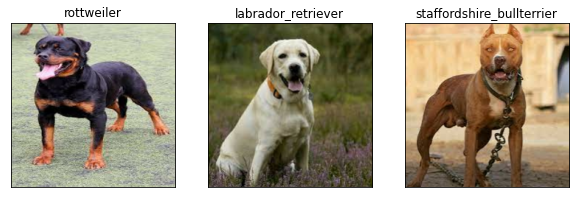

In [149]:
# Check custom image prediction
plt.figure(figsize=(10,10))
for i, image in enumerate(custom_images):
  plt.subplot(1 , 3 , i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)
